In [1]:
from normalization_methods import *
import matplotlib.pyplot as plt

In [2]:
adat_path = r"./data/OH2024_014.adat"
somamer_data_path = r".\data\SomaScan_V4.1_7K_Annotated_Content_20241119.xlsx"

In [3]:
sampl = pd.read_csv(adat_path, skiprows=43, sep='\t')
sampl_cols = ['PlateId', 'PlatePosition', 'SampleId', 'SampleType',
              'SampleMatrix', 'Barcode', 'ExtIdentifier',]
sampl = sampl[sampl_cols]
seqid = ''
with open(adat_path, 'r') as file:
    lines = file.readlines()
    if len(lines) >= 32:
        seqid = lines[31].strip()
seqid_order_list = seqid.split('\t')[1:]

In [4]:
somamers = pd.read_excel(somamer_data_path, skiprows=8, sheet_name='Annotations')
somamers_cols = ['SeqId', 'SomaId', 'Target Name', 'UniProt ID',
                 'Entrez Gene ID', 'Entrez Gene Name', 'Type',
                 'Organism', 'Dilution', ]
somamers = somamers[somamers_cols]
somamers = somamers.rename(columns={'Target Name': 'Target',
                                    'UniProt ID': 'UniProt', 
                                    'Entrez Gene Name': 'EntrezGeneSymbol',
                                    'Entrez Gene ID': 'EntrezGeneID'})
somamers['Dilution'] = somamers['Dilution'].apply(lambda x: x[:-1].replace('.','_'))
somamers = somamers.sort_values(by='SeqId')
somamers = somamers.set_index('SeqId')
assert(all(somamers.index == seqid_order_list))

RFU = pd.read_csv(adat_path, skiprows=43, sep='\t')
control_samples = ['Calibrator', 'Buffer', 'QC']
control_rfu = RFU[RFU['SampleType'].isin(control_samples)]
control_rfu = control_rfu[control_rfu.columns[30:]]
RFU = RFU[RFU.columns[30:]]
RFU = RFU.rename(columns = {x: seqid_order_list[ind]  for ind, x in enumerate(RFU.columns)})
control_rfu = control_rfu.rename(columns = {x: seqid_order_list[ind]  for ind, x in enumerate(control_rfu.columns)})


In [5]:
norm = ["raw", "hyb", "hyb.msnCal", "hyb.msnCal.ps", "hyb.msnCal.ps.cal", "hyb.msnCal.ps.cal.msnAll"]

n_norm = len(norm)
n_sampl = sampl.shape[0]
n_somamer = somamers.shape[0]
plate = sampl["PlateId"].unique()  # Assuming "PlateId" is in the header
n_plate = len(plate)
dil = [0, 0.005, 0.5, 20]
dil_lab = ["0", "0_005", "0_5", "20"]
n_dil = len(dil)
sample_types = ['Sample', 'Buffer', 'Calibrator', 'QC']


In [6]:
ps_ref_path = '../SD4.1ReV_Plasma_Calibrator_200169.txt'

## hybridization normalization

In [7]:

RFU_hyb_ref = pd.read_csv(adat_path.replace('.adat','.hybNorm.adat'), skiprows=44, sep='\t')
RFU_hyb_ref_meta = RFU_hyb_ref[RFU_hyb_ref.columns[:32]]
RFU_hyb_ref = RFU_hyb_ref[RFU_hyb_ref.columns[32:]]
RFU_hyb_ref = RFU_hyb_ref.rename(columns = {x: seqid_order_list[ind]  for ind, x in enumerate(RFU_hyb_ref.columns)})
hyb_ratio = RFU_hyb_ref.values / RFU.values


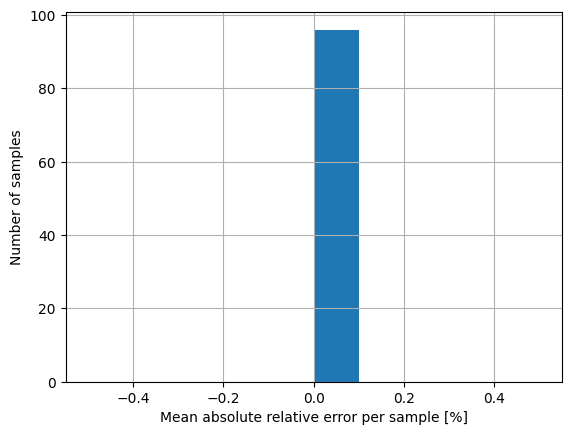

In [8]:
control_samples = ['Calibrator', 'Buffer', 'QC']
 
RFU_hyb = hyb_norm(RFU, control_rfu, somamers)

## Checking how much the hybridization normalization changed the data
hyb_transformation_effect = RFU/RFU_hyb_ref
extremes_1 = (hyb_transformation_effect.min().min(), hyb_transformation_effect.max().max())
# Checking the error of the reverse engineering
max_hybrid_normalization_error_upward = (RFU_hyb / RFU_hyb_ref).max().max()
max_hybrid_normalization_error_downward = (RFU_hyb / RFU_hyb_ref).min().min() # I got error of up to 3%

#(RFU_hyb / RFU_hyb_ref)

z = RFU_hyb / RFU

x = (RFU_hyb / RFU_hyb_ref)

y = (x <= 0.99) | (x>=1.01)


z = (np.abs(x-1)).apply(np.mean, axis=1) * 100
plt.figure()
z.hist()
plt.xlabel('Mean absolute relative error per sample [%]')
plt.ylabel('Number of samples')
plt.show()


In [9]:
normalization_effects = {}

In [10]:
normalization_effects['hybridization'] = RFU_hyb/RFU

In [11]:
normalization_effects['hybridization'].values.flatten()

array([1.04015583, 1.04007156, 1.04024145, ..., 0.9799369 , 0.97994038,
       0.97994111], shape=(729216,))

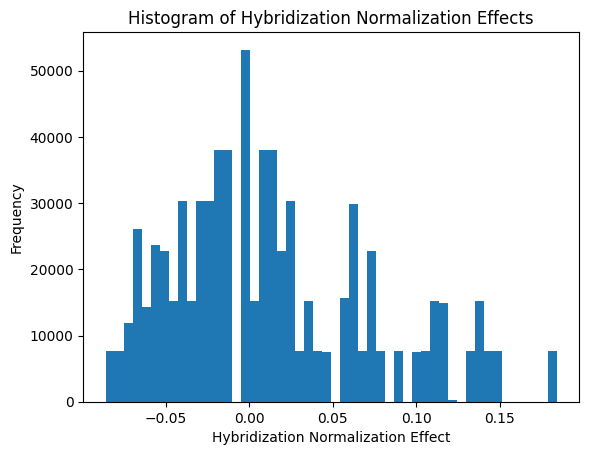

In [12]:
flat_vals = normalization_effects['hybridization'].values.flatten() - 1
plt.figure()
plt.hist(flat_vals, bins=50)
plt.xlabel('Hybridization Normalization Effect')
plt.ylabel('Frequency')
plt.title('Histogram of Hybridization Normalization Effects')
plt.show()

In [13]:
median_value = np.median(flat_vals)

In [14]:
filtered_values = flat_vals[flat_vals != median_value]


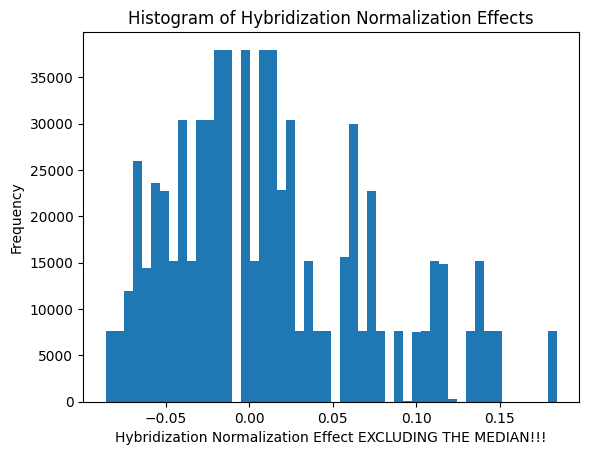

In [15]:
# flat_vals = normalization_effects['hybridization'].values.flatten() - 1
plt.figure()
plt.hist(filtered_values, bins=50)
plt.xlabel('Hybridization Normalization Effect EXCLUDING THE MEDIAN!!!')
plt.ylabel('Frequency')
plt.title('Histogram of Hybridization Normalization Effects')
plt.show()

## Median signal normalization

(array([1.32600e+03, 6.45400e+03, 6.25700e+03, 2.95000e+02, 6.93446e+05,
        7.59700e+03, 1.12900e+03, 1.26910e+04, 1.60000e+01, 5.00000e+00]),
 array([-0.05885444, -0.04527669, -0.03169894, -0.01812119, -0.00454343,
         0.00903432,  0.02261207,  0.03618982,  0.04976757,  0.06334533,
         0.07692308]),
 <BarContainer object of 10 artists>)

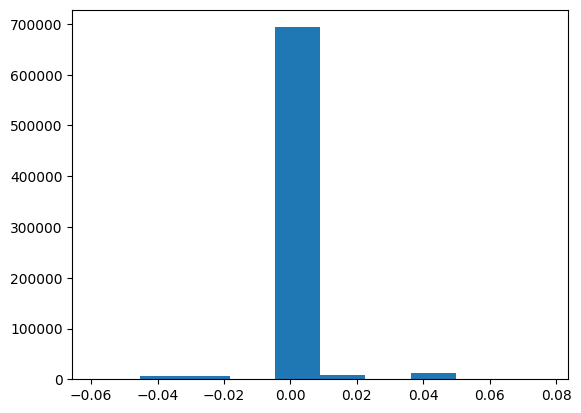

In [16]:
RFU_msnCal_ref = pd.read_csv(adat_path.replace('.adat','.hybNorm.medNormInt.adat'), skiprows=46, sep='\t')
RFU_msnCal_ref_meta = RFU_msnCal_ref[RFU_msnCal_ref.columns[:35]] # First time that norm scale columns appear. Changes only calibrators and buffer.
RFU_msnCal_ref = RFU_msnCal_ref[RFU_msnCal_ref.columns[35:]]
RFU_msnCal_ref = RFU_msnCal_ref.rename(columns = {x: seqid_order_list[ind]  for ind, x in enumerate(RFU_msnCal_ref.columns)})
msnCal_ratio = RFU_msnCal_ref / RFU_hyb_ref

plt.hist(msnCal_ratio.values.flatten() - 1)


In [17]:

flat_values = msnCal_ratio.values.flatten() - 1
median_value = np.median(flat_values)
filtered_values = flat_values[flat_values != median_value]

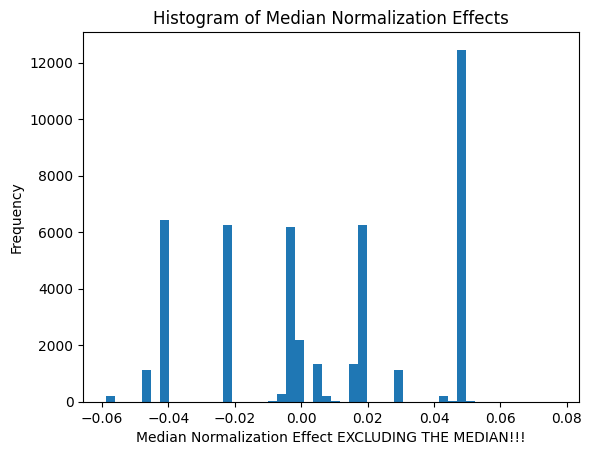

In [18]:
# flat_vals = normalization_effects['hybridization'].values.flatten() - 1
plt.figure()
plt.hist(filtered_values, bins=50)
plt.xlabel('Median Normalization Effect EXCLUDING THE MEDIAN!!!')
plt.ylabel('Frequency')
plt.title('Histogram of Median Normalization Effects')
plt.show()

In [20]:
RFU_msnCal = msnCal_norm(RFU_hyb_ref, somamers, sampl, dil_lab)

            
(RFU_msnCal / RFU_msnCal_ref).min().min()
(RFU_msnCal / RFU_msnCal_ref).max().max()

x = (RFU_msnCal / RFU_msnCal_ref)
y = (x < 0.99) | (x>1.01)
y = y.apply(sum, axis=1)

x.max().max()
x.min().min()

np.float64(0.9913385826771653)

In [21]:
RFU_msnCal2 = msnCal_norm2(RFU_hyb_ref, somamers, sampl, dil_lab)

In [22]:
(RFU_msnCal2 / RFU_msnCal_ref).max().max()


np.float64(1.9594594594594594)

In [23]:
(RFU_msnCal / RFU_msnCal_ref).max().max()


np.float64(1.0029635901778156)

In [24]:
RFU_msnCal_ref

,10000-28,10001-7,10003-15,10006-25,10008-43,10010-10,10011-65,10012-5,10013-34,10014-31,...,9984-12,9986-14,9987-30,9989-12,9991-112,9993-11,9994-217,9995-6,9997-12,9999-1
0,1415.1,592.6,367.5,1280.9,1004.3,868.0,5656.7,2857.8,992.4,2167.9,...,1274.2,6536.5,1670.2,1056.0,2894.3,2630.5,3597.4,4122.3,11755.7,2736.0
1,2883.2,1342.9,374.0,3397.0,1341.0,1032.5,13318.8,3988.7,1226.2,2912.5,...,1798.4,2450.5,1373.3,1392.3,1742.9,2714.6,5105.6,12490.6,13873.1,9225.2
2,1065.7,655.7,389.6,1245.0,908.8,645.2,5639.6,3005.7,850.3,1824.7,...,1309.6,3378.7,886.7,1174.6,818.4,2135.3,3714.4,3019.1,10381.1,2397.6
3,3183.6,1268.0,472.7,6121.6,2060.6,1401.9,20945.7,5679.6,1881.2,3824.7,...,2531.1,7962.7,2224.9,1804.6,2312.4,3942.7,6420.8,3955.9,7805.0,5255.0
4,1027.1,1445.2,382.7,1332.3,940.9,643.1,5266.3,2984.6,965.8,1817.9,...,1380.7,10134.0,1079.8,1074.0,1200.3,2362.7,4572.0,6244.9,51093.7,12152.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,5384.8,1270.1,542.2,4804.9,2033.8,1453.9,24488.3,7557.7,2352.8,4163.9,...,2912.3,7844.8,2575.8,1630.9,2869.2,4665.6,7680.5,7324.5,9768.3,6859.0
92,1081.1,742.9,480.0,4522.3,2247.2,660.3,4888.9,2424.9,812.5,1747.8,...,1213.1,2239.5,861.8,989.1,847.8,1754.4,2769.6,2534.5,12906.2,2370.2
93,1528.7,619.3,401.1,1338.5,1097.9,719.7,6091.1,4178.0,1166.2,2286.8,...,1627.1,6184.5,1265.2,1561.1,1146.5,3751.2,4317.5,11435.8,31354.7,3729.4
94,14050.4,1131.4,437.4,4489.7,1595.6,1189.0,19951.5,5604.2,1742.9,3752.8,...,2243.0,6490.2,1875.9,1400.2,2606.3,3558.1,6311.0,6798.3,9066.1,6390.8


In [25]:
somamers

,SomaId,Target,UniProt,EntrezGeneID,EntrezGeneSymbol,Type,Organism,Dilution
SeqId,,,,,,,,
10000-28,SL019233,CRBB2,P43320,1415,CRYBB2,Protein,Human,20
10001-7,SL002564,c-Raf,P04049,5894,RAF1,Protein,Human,20
10003-15,SL019245,ZNF41,P51814,7592,ZNF41,Protein,Human,0_5
10006-25,SL019228,ELK1,P19419,2002,ELK1,Protein,Human,20
10008-43,SL019234,GUC1A,P43080,2978,GUCA1A,Protein,Human,20
...,...,...,...,...,...,...,...,...
9993-11,SL019212,ZN264,O43296,9422,ZNF264,Protein,Human,20
9994-217,SL019217,ATP4B,P51164,496,ATP4B,Protein,Human,20
9995-6,SL013164,DUT,P33316,1854,DUT,Protein,Human,20


In [26]:
RFU_msnCal_ref/RFU_hyb_ref

,10000-28,10001-7,10003-15,10006-25,10008-43,10010-10,10011-65,10012-5,10013-34,10014-31,...,9984-12,9986-14,9987-30,9989-12,9991-112,9993-11,9994-217,9995-6,9997-12,9999-1
0,1.019231,1.019264,1.015474,1.019257,1.01918,1.019258,1.019225,1.019223,1.019205,1.019229,...,1.019197,1.019226,1.019223,1.019207,1.019227,1.019218,1.019238,1.019236,1.01923,1.019222
1,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
2,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
3,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
4,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
92,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
93,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000
94,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000


In [37]:
calibrator_ratios = (RFU_msnCal_ref/RFU_hyb_ref)[((RFU_msnCal_ref/RFU_hyb_ref)['10000-28'] != 1)]

In [38]:
calibrator_ratios

,10000-28,10001-7,10003-15,10006-25,10008-43,10010-10,10011-65,10012-5,10013-34,10014-31,...,9984-12,9986-14,9987-30,9989-12,9991-112,9993-11,9994-217,9995-6,9997-12,9999-1
0,1.019231,1.019264,1.015474,1.019257,1.019180,1.019258,1.019225,1.019223,1.019205,1.019229,...,1.019197,1.019226,1.019223,1.019207,1.019227,1.019218,1.019238,1.019236,1.019230,1.019222
15,1.047224,1.047280,1.005784,1.047219,1.047205,1.047268,1.047227,1.047241,1.047277,1.047235,...,1.047245,1.047216,1.047235,1.047201,1.047213,1.047207,1.047213,1.047215,1.047223,1.047237
20,0.997804,0.997950,1.000000,0.998131,0.997916,0.998122,0.998142,0.998049,0.998214,0.997915,...,0.997951,0.998131,0.997862,0.998006,0.998060,0.998028,0.998046,0.997994,0.997789,0.998139
33,0.957898,0.957982,0.952856,0.957930,0.957935,0.957878,0.957907,0.957907,0.957869,0.957909,...,0.957891,0.957907,0.957881,0.957882,0.957914,0.957919,0.957901,0.957902,0.957906,0.957891
53,1.048441,1.048265,0.995608,1.047973,1.048304,1.048175,1.048321,1.048207,1.048397,1.048309,...,1.048108,1.048309,1.048233,1.048318,1.048596,1.048222,1.048281,1.048286,1.048092,1.048232
78,0.977999,0.978067,1.000000,0.978013,0.978050,0.978014,0.978009,0.978011,0.978002,0.978026,...,0.978020,0.978009,0.978043,0.978016,0.978006,0.978006,0.978017,0.978014,0.978019,0.978002


In [42]:
(RFU_msnCal.iloc[calibrator_ratios.index, :]/ RFU_msnCal_ref.iloc[calibrator_ratios.index, :]).max().max()

np.float64(1.0029635901778156)